In [1]:
%pip install astropy astroquery numpy scipy matplotlib


Note: you may need to restart the kernel to use updated packages.


In [4]:
# Install if needed:
# !pip install astropy photutils matplotlib

from astropy.io import fits
import numpy as np
from astropy.stats import sigma_clipped_stats
from photutils.detection import DAOStarFinder
from astropy.visualization import LogStretch, ImageNormalize
import matplotlib.pyplot as plt

# 1) Load your FITS file
fname = 'M31_R_29092016.fits'    # ← change this
hdu = fits.open(fname)
data = hdu[0].data.astype(float)
hdu.close()

# 2) Estimate background & noise
mean_sig, median_sig, std_sig = sigma_clipped_stats(data, sigma=3.0)

# 3) Detect sources (tune threshold if you want fainter/brighter)
daofind = DAOStarFinder(fwhm=3.0, threshold=3.0 * std_sig)
sources = daofind(data - median_sig)

# 4) Prepare the log‐scaled image
norm = ImageNormalize(data, stretch=LogStretch())

# 5) Plot & label
fig, ax = plt.subplots(figsize=(12,12), dpi=200)
ax.imshow(data, cmap='gray', norm=norm, origin='lower')
ax.set_axis_off()

# Overplot small markers + tiny IDs
for i, (x, y) in enumerate(zip(sources['xcentroid'], sources['ycentroid']), start=1):
    ax.plot(x, y, marker='o', markersize=3, markeredgecolor='red', markerfacecolor='none', linewidth=0.5)
    ax.text(x+2, y+2, str(i), fontsize=4, color='yellow', ha='left', va='bottom')

# 6) Save out a high-res image for zooming
outname = 'labeled_stars.png'   # or .pdf/.tiff
plt.savefig(outname, bbox_inches='tight', pad_inches=0.1)
plt.close(fig)

print(f"Saved labeled image as {outname} (12″×12″ at 200 dpi).")



Saved labeled image as labeled_stars.png (12″×12″ at 200 dpi).


,Label,x (px),y (px)
0,1,2690.40,0.82
1,2,1779.56,4.92
2,3,3408.95,6.44
3,4,124.67,8.70
4,5,1839.32,6.86
...,...,...,...
2493,2494,3189.38,4047.06
2494,2495,3194.04,4046.34
2495,2496,3189.28,4093.54
2496,2497,3193.92,4093.54


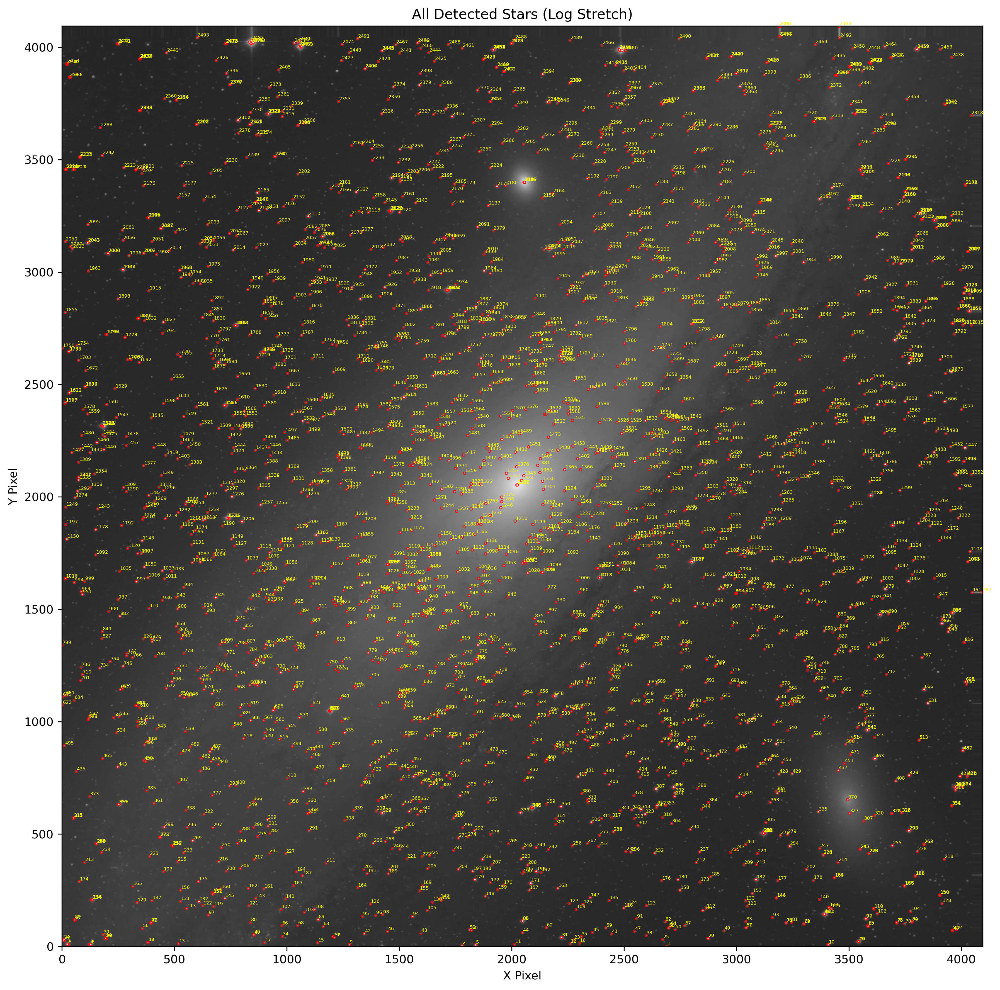

→ High‑res labeled image saved as: labeled_stars.png
→ Star coordinate table saved as: star_table.csv


In [7]:
# If needed:
# !pip install astropy photutils pandas matplotlib

from astropy.io import fits
import numpy as np
from astropy.stats import sigma_clipped_stats
from astropy.visualization import LogStretch, ImageNormalize
from photutils.detection import DAOStarFinder
import pandas as pd
import matplotlib.pyplot as plt

# 1) Load your FITS
fn = 'M31_R_29092016.fits'   # ← update to your filename
hdu = fits.open(fn)
data = hdu[0].data.astype(float)
hdu.close()

# 2) Background stats
mean_, med_, std_ = sigma_clipped_stats(data, sigma=3.0)

# 3) Detect faint stars (~3σ threshold)
daofind = DAOStarFinder(fwhm=3.0, threshold=7.0 * std_)
sources = daofind(data - med_)

# 4) Build the table of labels and exact coords
x = sources['xcentroid']
y = sources['ycentroid']
labels = np.arange(1, len(x) + 1)

df = pd.DataFrame({
    'Label': labels,
    'x (px)': np.round(x, 2),
    'y (px)': np.round(y, 2)
})
display(df)               # shows table in your notebook
df.to_csv('star_table.csv', index=False)   # saves CSV if you want

# 5) Log‐stretch normalization
norm = ImageNormalize(data, stretch=LogStretch(), clip=False)

# 6) Plot + tiny labels, save high‐res image
fig, ax = plt.subplots(figsize=(12,12), dpi=300)
ax.imshow(data, origin='lower', cmap='gray', norm=norm)
ax.scatter(x, y, s=5, edgecolor='red', facecolor='none', linewidth=0.5)

for lbl, xi, yi in zip(labels, x, y):
    ax.text(xi+2, yi+2, str(lbl),
            color='yellow', fontsize=4,
            ha='left', va='bottom')

ax.set(title='All Detected Stars (Log Stretch)', xlabel='X Pixel', ylabel='Y Pixel')
plt.tight_layout()
outfn = 'labeled_stars.png'
plt.savefig(outfn, dpi=300, bbox_inches='tight')
plt.show()

print(f"→ High‑res labeled image saved as: {outfn}")
print(f"→ Star coordinate table saved as: star_table.csv")


In [53]:
df2 = df.set_index('Label')
print(df2.loc[1417])


x (px)    1786.60
y (px)    2186.11
Name: 1417, dtype: float64
